In [1]:
library(Seurat)
library(tidyverse)
library(patchwork)
options(tibble.print_max = 200, width=200)

Loading required package: SeuratObject

Loading required package: sp


Attaching package: ‘SeuratObject’


The following object is masked from ‘package:base’:

    intersect


── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()


In [383]:
xenium.obj = qs::qread('../01_resolve/_targets/objects/obj_merged')
xenium.obj

An object of class Seurat 
400 features across 119775 samples within 4 assays 
Active assay: Xenium (100 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [385]:
cutoff_size = 100

meta = xenium.obj %>%
`[[` %>%
mutate(cells_bigger = case_when(cell_area > cutoff_size ~ 'bigger',
                                cell_area <= cutoff_size ~ 'smaller'))

xenium.obj = xenium.obj %>% AddMetaData(meta)

In [387]:
options(repr.plot.width=4, repr.plot.height=3, repr.plot.res=300)
DimPlot(xenium.obj, group.by = 'cells_bigger')

ERROR: [1m[33mError[39m in `DefaultDimReduc()`:[22m
[33m![39m Unable to find a DimReduc matching one of 'umap', 'tsne', or 'pca'; please specify a dimensional reduction to use


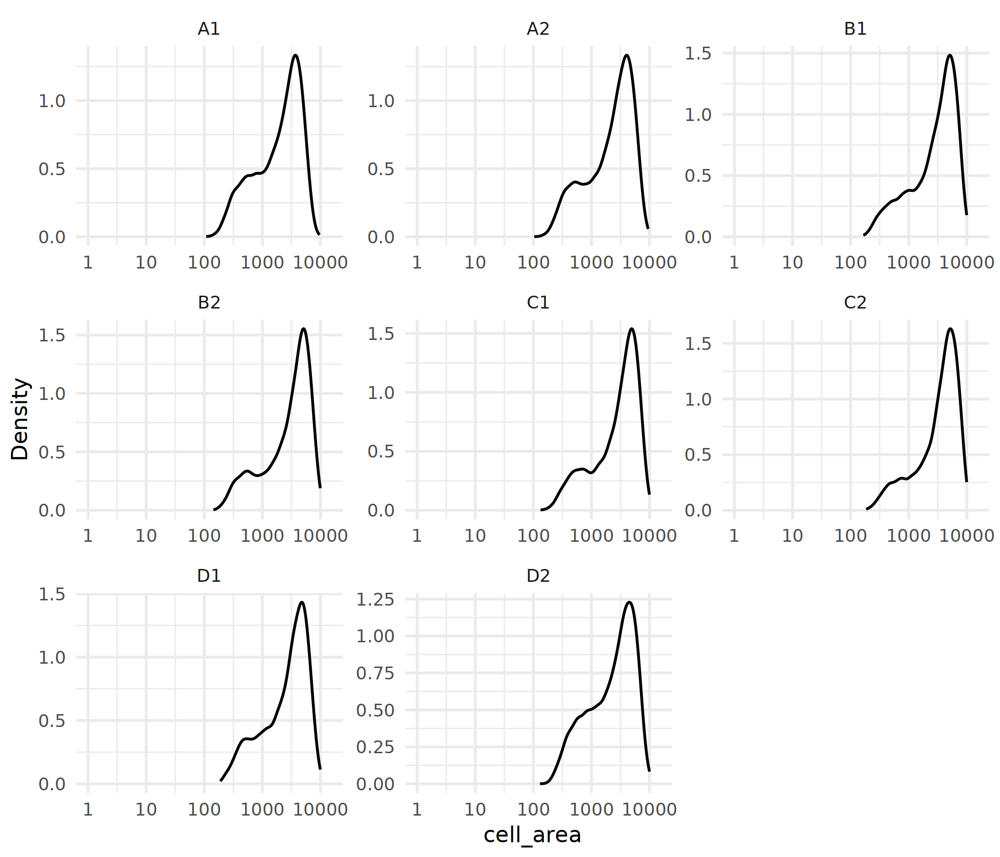

In [381]:
options(repr.plot.width=7, repr.plot.height=6)

filter_down_cells_v02 = function(xenium.obj){
    keep_cells = xenium.obj %>% `[[` %>%
        filter(cell_area < 10000) %>%
        filter(cell_area > 10) %>%
        filter(avg_confidence >= 0.99) %>%
#         filter(nCount_Xenium >= 100) %>%
        filter(nCount_Xenium >= 20) %>%
        filter(nCount_Xenium <= 10000) %>%
        rownames
    xenium.obj = subset(xenium.obj, cells = keep_cells)
    xenium.obj
}


df = xenium.obj %>% 
filter_down_cells_v02 %>% 
suppressWarnings %>% `[[` %>% filter(!is.na(sample_name))

ggplot(df, aes(x = cell_area)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
  scale_x_log10() +
  coord_cartesian(xlim = c(1, 15000)) +
  theme_minimal() +
  labs(x = "cell_area", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

In [382]:
df %>% dim

[1] 59681    18

In [3]:
df = xenium.obj %>% `[[` %>% filter(!is.na(sample_name))

In [4]:
df %>% colnames

[1] "orig.ident"               "nCount_Xenium"            "nFeature_Xenium"          "nCount_BlankCodeword"     "nFeature_BlankCodeword"   "nCount_ControlCodeword"   "nFeature_ControlCodeword"
 [8] "nCount_ControlProbe"      "nFeature_ControlProbe"    "cell_area"                "density"                  "elongation"               "avg_confidence"           "nucleus_area"            
[15] "sample_name"              "treatment"                "strain"                   "time"

In [5]:
df %>% head

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,density,elongation,avg_confidence,nucleus_area,sample_name,treatment,strain,time
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>
0_1,SeuratProject,1073434,100,0,0,0,0,0,0,NA,NA,NA,NA,NA,A1,Veh_PF,obob,obob
Cell10000_9129_13312_1,SeuratProject,113,38,0,0,0,0,0,0,1271,0.08891,7.134,0.9961,NA,A1,Veh_PF,obob,obob
Cell10001_7423_16733_1,SeuratProject,31,18,0,0,0,0,0,0,467,0.06638,4.243,0.9906,NA,A1,Veh_PF,obob,obob
Cell10002_2432_2392_1,SeuratProject,62,28,0,0,0,0,0,0,1197,0.05180,2.128,0.9928,NA,A1,Veh_PF,obob,obob
Cell10003_8358_77_1,SeuratProject,123,32,0,0,0,0,0,0,2649,0.04643,1.656,0.9899,NA,A1,Veh_PF,obob,obob
Cell10004_9190_600_1,SeuratProject,93,35,0,0,0,0,0,0,2361,0.03939,1.237,0.9907,NA,A1,Veh_PF,obob,obob


In [6]:
source('../01_resolve/resolve.R')

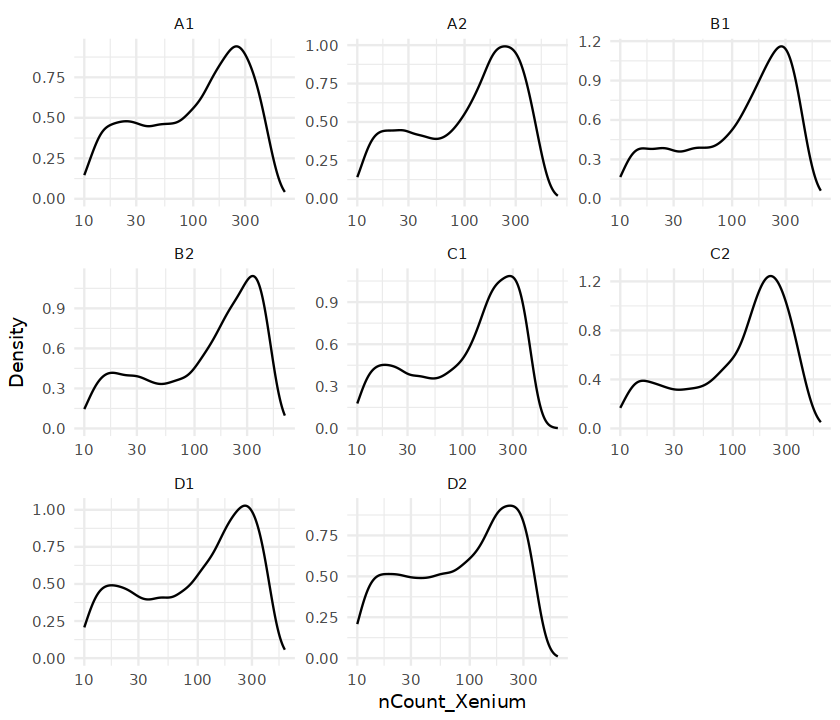

In [7]:
options(repr.plot.width=7, repr.plot.height=6)

filter_down_cells = function(xenium.obj){
    keep_cells = xenium.obj %>% `[[` %>%
        filter(cell_area < 7000) %>%
        filter(cell_area > 100) %>%
        filter(avg_confidence >= 0.99) %>%
        filter(nCount_Xenium >= 10) %>%
        filter(nCount_Xenium <= 10000) %>%
        rownames
    xenium.obj = subset(xenium.obj, cells = keep_cells)
    xenium.obj
}

df = xenium.obj %>% 
filter_down_cells %>% 
suppressWarnings %>% `[[` %>% filter(!is.na(sample_name))

ggplot(df, aes(x = nCount_Xenium)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
  scale_x_log10() +
  theme_minimal() +
  labs(x = "nCount_Xenium", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

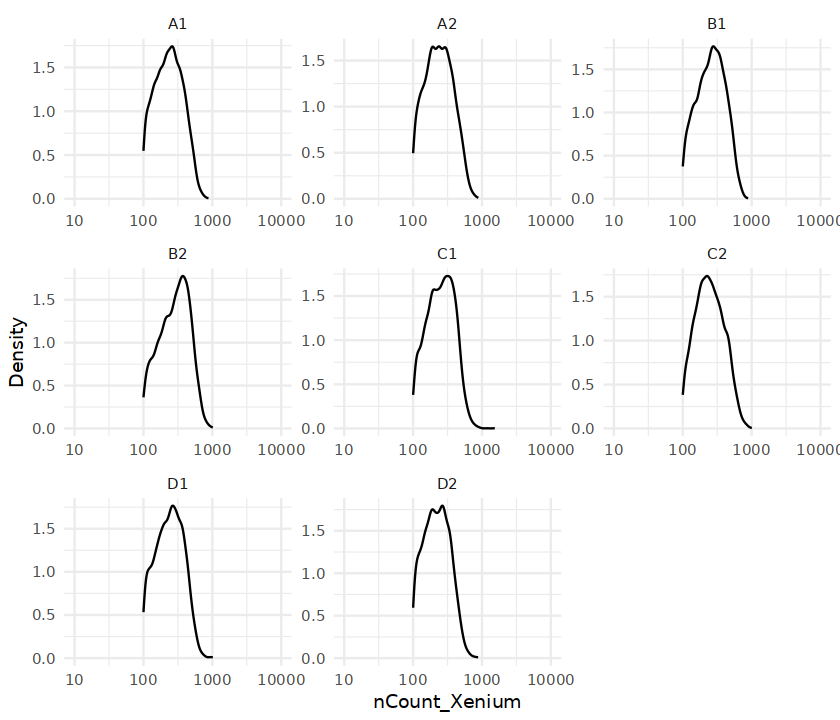

In [8]:
options(repr.plot.width=7, repr.plot.height=6)

filter_down_cells = function(xenium.obj){
    keep_cells = xenium.obj %>% `[[` %>%
        filter(cell_area < 20000) %>%
        filter(cell_area > 100) %>%
        filter(avg_confidence >= 0.99) %>%
        filter(nCount_Xenium >= 100) %>%
        filter(nCount_Xenium <= 10000) %>%
        rownames
    xenium.obj = subset(xenium.obj, cells = keep_cells)
    xenium.obj
}

df = xenium.obj %>% 
filter_down_cells %>% 
suppressWarnings %>% `[[` %>% filter(!is.na(sample_name))

ggplot(df, aes(x = nCount_Xenium)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
  scale_x_log10() +
  coord_cartesian(xlim = c(10, 10000)) +
  theme_minimal() +
  labs(x = "nCount_Xenium", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

In [9]:
df %>% dim

[1] 40419    18

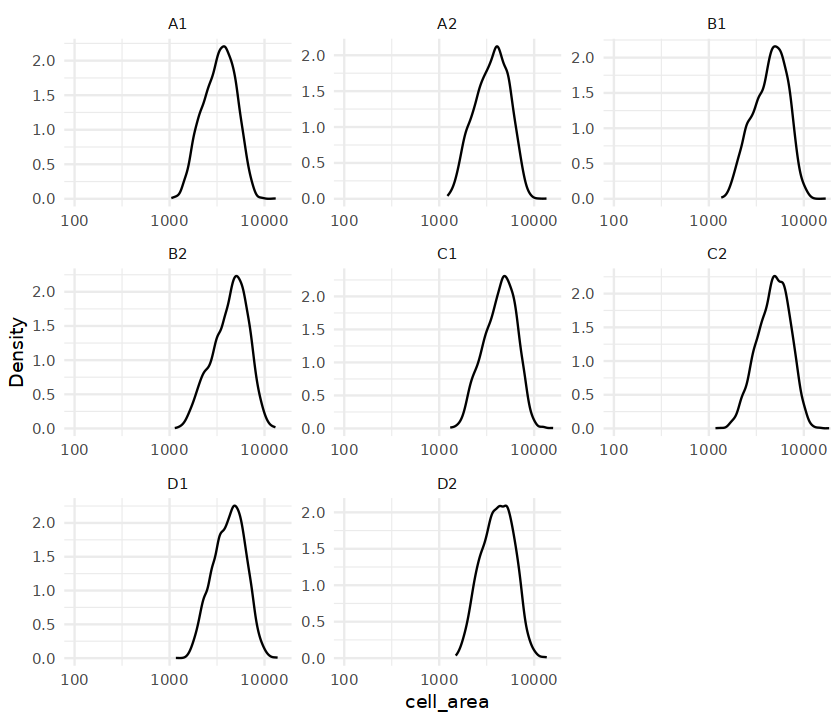

In [10]:
ggplot(df, aes(x = cell_area)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
  scale_x_log10() +
  coord_cartesian(xlim = c(100, 15000)) +
  theme_minimal() +
  labs(x = "cell_area", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

In [11]:
combined_pldf = qs::qread('../01_milo_cellbender/_targets_MAST/objects/combined_pldf_all.obobBL6d5')

In [12]:
combined_pldf %>% head

,polar_label
,<chr>
SI-TT-A11_AAACCCAGTACGTTCA...1,Agrp.neg
SI-TT-A11_AAACGAACAAGTTTGC...2,Agrp.neg
SI-TT-A11_AAAGTCCTCGACATTG...3,Agrp.neg
SI-TT-A11_AAATGGAAGAAACACT...4,Agrp.pos
SI-TT-A11_AACAAAGAGGACAAGA...5,Agrp.neg
SI-TT-A11_AACAAGACAGCTAACT...6,Agrp.neg


In [13]:
obj_cb_class = qs::qread('../00_cellbender/_targets/objects/obj_cb_class')
obj_cb_class

An object of class Seurat 
29458 features across 135962 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [14]:
obj_cb_class %>% `[[` %>% head

,orig.ident,nCount_RNA,nFeature_RNA,nCount_RNA_SCOP,nFeature_RNA_SCOP,Index.10x_SCOP,nCount_HTO_SCOP,nFeature_HTO_SCOP,Index.HTO_SCOP,nCount_spliced_SCOP,⋯,barcode,strain,treatment,time,collection_date,isolation_date,batch,integrated_snn_res.0.5,seurat_clusters,class
,<chr>,<dbl>,<int>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<fct>,<fct>,<fct>
SI-TT-A11_AAACCCAAGGTGGTTG,SI-TT-A11,5428,2686,18589,4492,SI-TT-A11,1233,12,D706,2936,⋯,AAACCCAAGGTGGTTG,obob,Veh_PF,Day14,220201,22/6/2022,Batch 1,28,28,neuron
SI-TT-A11_AAACCCACATACAGCT,SI-TT-A11,6796,3192,22352,4816,SI-TT-A11,1000,12,D706,2976,⋯,AAACCCACATACAGCT,obob,Veh_PF,Day5,220329,22/6/2022,Batch 1,7,7,neuron
SI-TT-A11_AAACCCACATGAGGGT,SI-TT-A11,13576,5516,44099,7365,SI-TT-A11,12215,12,D706,7888,⋯,AAACCCACATGAGGGT,obob,Veh_PF,Day14,220407,22/6/2022,Batch 1,35,35,neuron
SI-TT-A11_AAACCCAGTACGTTCA,SI-TT-A11,3849,2247,17749,4347,SI-TT-A11,1699,12,D706,2474,⋯,AAACCCAGTACGTTCA,BL6,Veh_PF,Day14,220407,22/6/2022,Batch 1,4,4,neuron
SI-TT-A11_AAACCCAGTATCGGTT,SI-TT-A11,1534,1176,4761,2296,SI-TT-A11,1150,12,D706,944,⋯,AAACCCAGTATCGGTT,BL6,Veh_PF,Day14,220407,22/6/2022,Batch 1,2,2,other
SI-TT-A11_AAACCCATCCAAGCAT,SI-TT-A11,6044,3023,21805,4803,SI-TT-A11,2167,12,D706,3573,⋯,AAACCCATCCAAGCAT,obob,FGF1,Day5,211213,22/6/2022,Batch 1,34,34,neuron


In [15]:
obj_cb_class %>% `[[` %>% colnames

[1] "orig.ident"                         "nCount_RNA"                         "nFeature_RNA"                       "nCount_RNA_SCOP"                    "nFeature_RNA_SCOP"                 
 [6] "Index.10x_SCOP"                     "nCount_HTO_SCOP"                    "nFeature_HTO_SCOP"                  "Index.HTO_SCOP"                     "nCount_spliced_SCOP"               
[11] "nFeature_spliced_SCOP"              "nCount_unspliced_SCOP"              "nFeature_unspliced_SCOP"            "HTO_mcl_maxID_SCOP"                 "HTO_mcl_secondID_SCOP"             
[16] "HTO_mcl_margin_SCOP"                "HTO_mcl_classification_SCOP"        "HTO_mcl_classification.global_SCOP" "hash.mcl.ID_SCOP"                   "doublet_SCOP"                      
[21] "predicted_dub_std_SCOP"             "predicted_dub_cut_SCOP"             "barcode_SCOP"                       "Index.10x"                          "barcode"                           
[26] "strain"                             "treatment"                          "time"                               "collection_date"                    "isolation_date"                    
[31] "batch"                              "integrated_snn_res.0.5"             "seurat_clusters"                    "class"

In [16]:
source('../00_cellbender/cellbender_preprocess.R')

In [17]:
nhgc_d5 = qs::qread('../01_milo_cellbender/_targets_MAST/objects/combined_nhgc_Day5.obob5v5__v__Day5.obobBL6d5') 
nhgc_d5

rowname,restored_grouping,bl6_grouping,fgf1_grouping
<chr>,<fct>,<chr>,<chr>
SI-TT-F10_AGCGTATCAATTTCCT,pos_away,pos,pos
SI-TT-E12_AGATGCTGTAAGAACT,pos_away,pos,pos
SI-TT-F11_TTCGGTCGTCCGGTGT,pos_away,pos,pos
SI-TT-F10_ACAGAAAGTGCATACT,neg_restored,pos,neg
SI-TT-F10_ACTATGGAGCCTGCCA,neg_restored,pos,neg
SI-TT-F10_GGGTCACGTCATAACC,neg_restored,pos,neg
SI-TT-A12_TTAGGCAGTACTGACT,neg_restored,pos,neg
SI-TT-B12_CCTCCAAGTTGACGGA,neg_restored,pos,neg
SI-TT-B12_TGTTCCGGTCTGTGTA,neg_restored,pos,neg


In [370]:
nhgc_d5 %>% distinct(rowname)

rowname
<chr>
SI-TT-F10_AGCGTATCAATTTCCT
SI-TT-E12_AGATGCTGTAAGAACT
SI-TT-F11_TTCGGTCGTCCGGTGT
SI-TT-F10_ACAGAAAGTGCATACT
SI-TT-F10_ACTATGGAGCCTGCCA
SI-TT-F10_GGGTCACGTCATAACC
SI-TT-A12_TTAGGCAGTACTGACT
SI-TT-B12_CCTCCAAGTTGACGGA
SI-TT-B12_TGTTCCGGTCTGTGTA


In [368]:
gbr_obj = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_neuron_obob5v5')
gbr_obj

An object of class Seurat 
58321 features across 44641 samples within 3 assays 
Active assay: SCT (26000 features, 3000 variable features)
 3 layers present: counts, data, scale.data
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [369]:
gbr_obj %>% `[[` %>% head

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,collection_date,isolation_date,batch,predicted.id,prediction.score.max,labels,cell_class,polar_label,nCount_integrated,nFeature_integrated
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>
GCAGCCACACAGCCAC_1_1,SI-TT-A11,69641,7356,SI-TT-A11,1532,12,D706,9837,3757,59804,⋯,220329,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
GTAATGCTCTGTCCCA_1_1,SI-TT-A11,69910,7425,SI-TT-A11,2555,12,D706,10497,3727,59413,⋯,211213,22/6/2022,Batch 1,Hdc,1.0000000,Gm8773_Tac1-Hdc,neuron,Gm8773_Tac1__Hdc.none,0,0
GATCACACACCCAAGC_1_1,SI-TT-A11,62110,6862,SI-TT-A11,1728,12,D706,9451,3566,52659,⋯,220329,22/6/2022,Batch 1,Unassigned1,0.6368759,Unassigned1.sc37,neuron,Unassigned1.sc37.none,0,0
GGACGTCCAGGCCCTA_1_1,SI-TT-A11,63372,7265,SI-TT-A11,1778,12,D706,8563,3478,54809,⋯,211214,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
CGTTCTGGTTGTCCCT_1_1,SI-TT-A11,64906,7215,SI-TT-A11,1713,12,D706,8040,3412,56866,⋯,211214,22/6/2022,Batch 1,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
TATCTTGCATCGATAC_1_1,SI-TT-A11,64508,8741,SI-TT-A11,6863,12,D706,11942,4514,52566,⋯,211213,22/6/2022,Batch 1,Tbx19,0.3327105,Tbx19,neuron,Tbx19.none,0,0


In [18]:
meta = nhgc_d5 %>% column_to_rownames
obj_cb_class = obj_cb_class %>% AddMetaData(meta)

In [19]:
cells_d5_obob = obj_cb_class %>%
    `[[` %>%
    filter(strain=='obob') %>%
    filter(time == 'Day5') %>%
    filter(!is.na(fgf1_grouping)) %>%
    rownames

cells_d5_obob %>% length

[1] 52605

In [20]:
xe_feats = xenium.obj %>% Features %>% .[. != 'Lmx1a']

In [21]:
obj_cb_class = obj_cb_class %>% 
    subset(cells = cells_d5_obob)

In [22]:
obj_cb_class

An object of class Seurat 
29458 features across 52605 samples within 2 assays 
Active assay: integrated (2000 features, 2000 variable features)
 2 layers present: data, scale.data
 1 other assay present: RNA
 2 dimensional reductions calculated: pca, umap

In [23]:
DefaultAssay(obj_cb_class) = 'RNA'

other_markers = obj_cb_class %>% 
    subset(cells = cells_d5_obob) %>%
    subset(., cells = sample(Cells(.), 10000)) %>%
    FindMarkers(features = xe_feats,
                slot='counts',
                group.by='class',
                ident.1='other',
                ident.2='neuron',
                test.use='negbinom',
                latent.vars="hash.mcl.ID_SCOP")

In [24]:
source('../01_milo/milo.R')

In [25]:
other_markers = other_markers %>%
mutate(p_val_adj = case_when(p_val_adj < 1e-40 ~ 1e-40,
                             TRUE ~ p_val_adj)) %>%
add_gsea_cols_to_seurat_marker_results %>%
mutate(pct_diff = abs(pct.1 - pct.2)) %>%
arrange(pct_diff) %>%
filter(p_val_adj < 0.05) %>%
arrange(p_val_adj, desc(pct_diff))

Joining with `by = join_by(GeneID)`


In [26]:
markers_of_other = other_markers %>% 
filter(gsea_sort_score > 0) %>%
# filter(pct_diff > 0.3) %>%
# filter(pct.2 < 0.4) %>%
arrange(desc(gsea_sort_score))

markers_of_other

GeneID,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,ensmusg,gsea_sort_score,pct_diff
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
Pdgfra,8.313033e-61,6.0793467,0.068,0.003,1.000000e-40,ENSMUSG00000029231,243.173869,0.065
Aqp4,5.160561e-105,5.5496778,0.157,0.005,1.000000e-40,ENSMUSG00000024411,221.987111,0.152
Rax,3.228801e-73,5.5463492,0.111,0.003,1.000000e-40,ENSMUSG00000024518,221.853969,0.108
Slc1a2,0.000000e+00,5.0784368,0.720,0.102,1.000000e-40,ENSMUSG00000005089,203.137472,0.618
Slc7a11,0.000000e+00,4.8071500,0.366,0.033,1.000000e-40,ENSMUSG00000027737,192.285999,0.333
Plp1,8.563594e-201,3.8704894,0.185,0.082,1.000000e-40,ENSMUSG00000031425,154.819575,0.103
Cfap299,2.679813e-73,3.3618953,0.108,0.023,1.000000e-40,ENSMUSG00000057816,134.475811,0.085
Pdzrn3,3.899293e-161,3.2566745,0.290,0.075,1.000000e-40,ENSMUSG00000035357,130.266981,0.215
Lrmda,0.000000e+00,2.8362553,0.578,0.130,1.000000e-40,ENSMUSG00000063458,113.450213,0.448


In [389]:
markers_of_other %>% head(20) %>% pull(GeneID) %>% dput

c("Pdgfra", "Aqp4", "Rax", "Slc1a2", "Slc7a11", "Plp1", "Cfap299", 
"Pdzrn3", "Lrmda", "Bmp4", "Gpc5", "Trpm3", "P3h2", "Slit2", 
"Rgs6", "Sox5", "Deptor", "Fat3", "Luzp2", "Ptprt")


In [27]:
options(repr.plot.width=15, repr.plot.height=4, repr.plot.res=300)

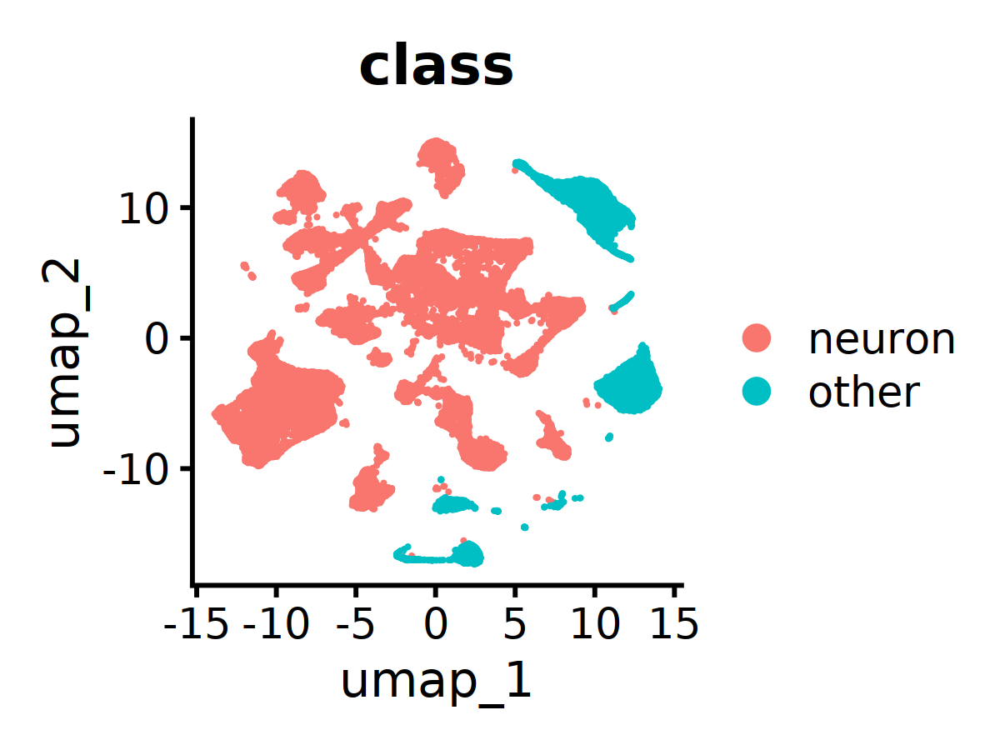

In [28]:
options(repr.plot.width=4, repr.plot.height=3, repr.plot.res=300)
DimPlot(obj_cb_class, group.by = 'class')

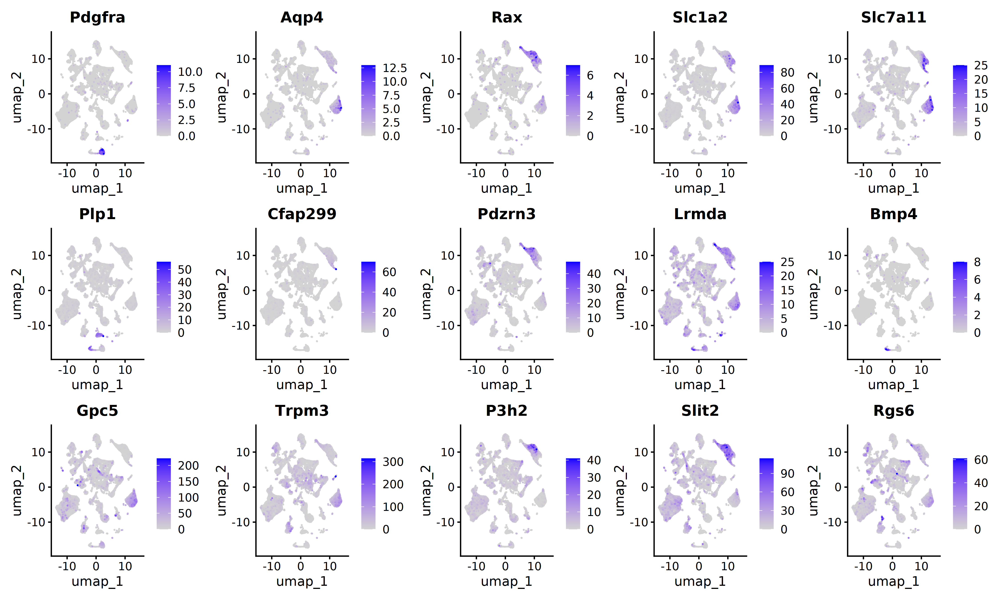

In [29]:
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(obj_cb_class, ncol = 5, order = T, slot = 'counts',
            cells = cells_d5_obob, 
            features = markers_of_other %>% pull(GeneID) %>% head(15))

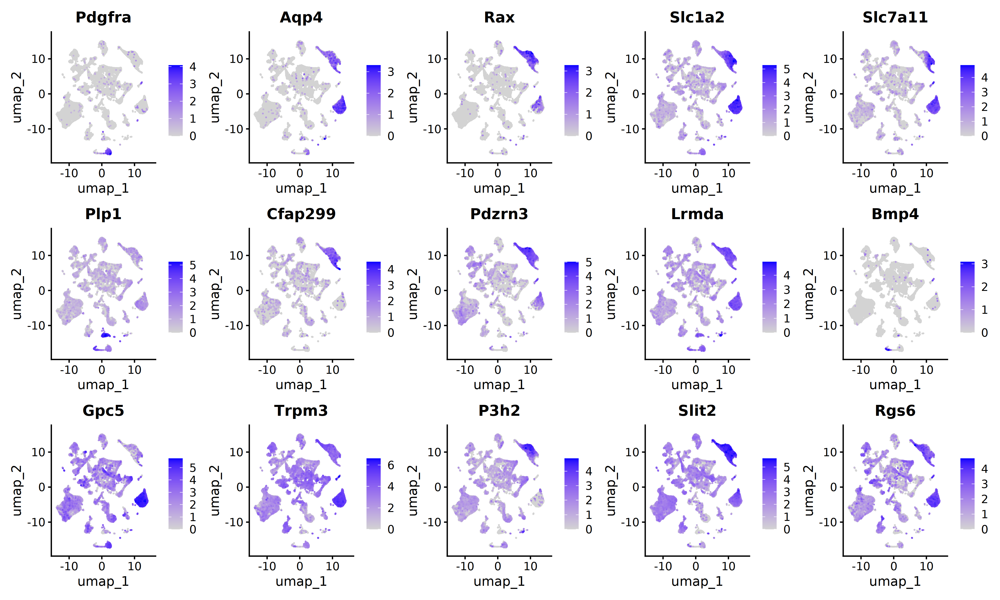

In [30]:
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(obj_cb_class, ncol = 5, order = T,
            cells = cells_d5_obob, 
            features = markers_of_other %>% pull(GeneID) %>% head(15))

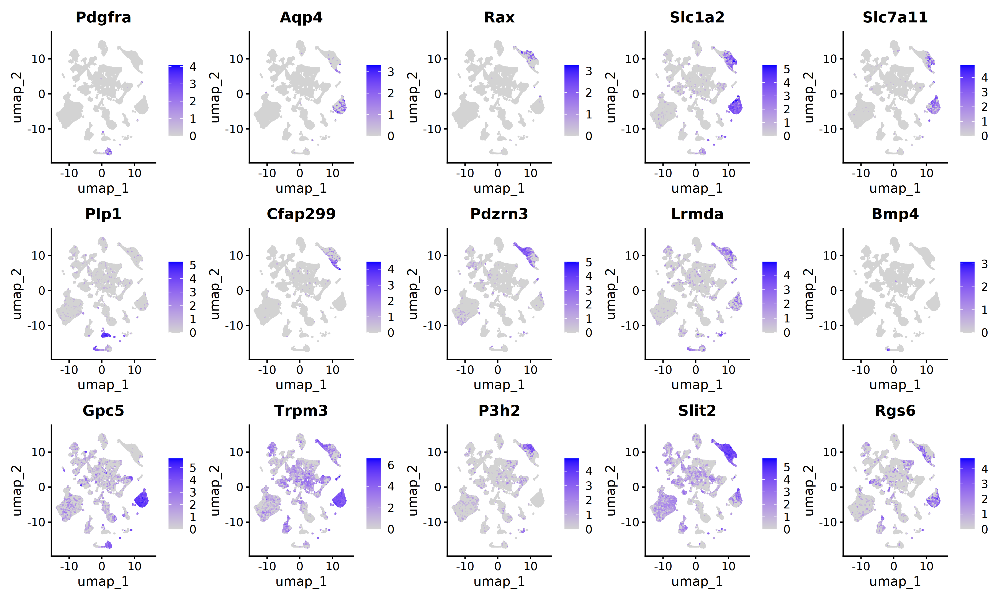

In [31]:
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(obj_cb_class, ncol = 5,
            cells = cells_d5_obob, 
            features = markers_of_other %>% pull(GeneID) %>% head(15))

In [32]:
markers_of_other_neg = other_markers %>% 
filter(gsea_sort_score < 0) %>%
# filter(pct_diff > 0.3) %>%
# filter(pct.2 < 0.4) %>%
arrange(gsea_sort_score)

markers_of_other_neg

GeneID,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,ensmusg,gsea_sort_score,pct_diff
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
Cntn5,1.773007e-168,-10.741159,0.006,0.737,1.000000e-40,ENSMUSG00000039488,-429.6463,0.731
Hs3st4,7.533008e-58,-10.178725,0.002,0.462,1.000000e-40,ENSMUSG00000078591,-407.1490,0.460
Zfp804b,6.779183e-113,-9.463855,0.005,0.532,1.000000e-40,ENSMUSG00000092094,-378.5542,0.527
Galntl6,0.000000e+00,-8.320099,0.019,0.776,1.000000e-40,ENSMUSG00000096914,-332.8040,0.757
Lingo2,0.000000e+00,-8.012080,0.036,0.900,1.000000e-40,ENSMUSG00000045083,-320.4832,0.864
Grm8,0.000000e+00,-6.826836,0.023,0.599,1.000000e-40,ENSMUSG00000024211,-273.0734,0.576
Tenm2,0.000000e+00,-6.701940,0.108,0.906,1.000000e-40,ENSMUSG00000049336,-268.0776,0.798
Car10,0.000000e+00,-6.284401,0.044,0.753,1.000000e-40,ENSMUSG00000056158,-251.3760,0.709
Nrg3,0.000000e+00,-5.990112,0.091,0.995,1.000000e-40,ENSMUSG00000041014,-239.6045,0.904


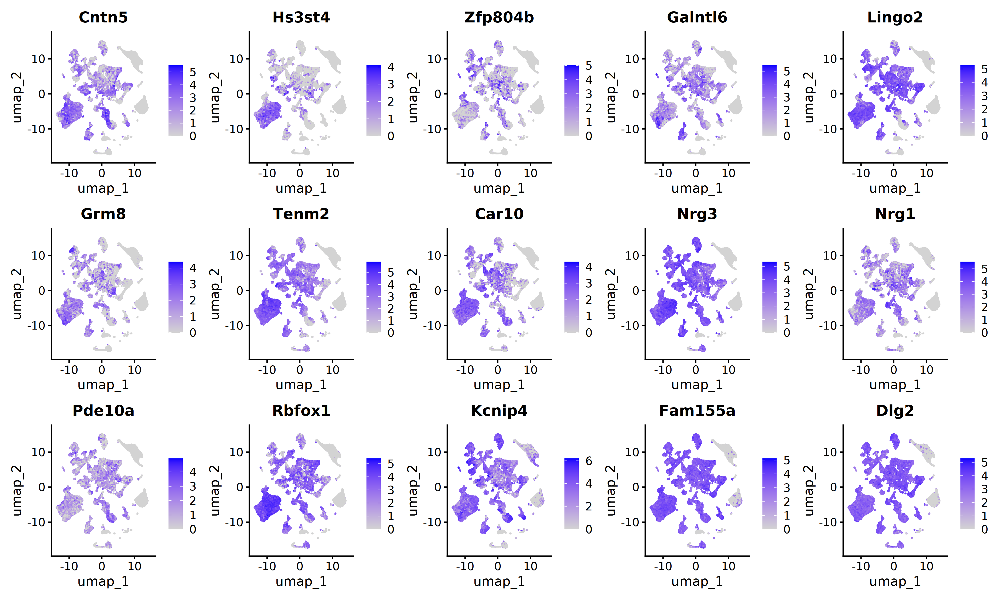

In [33]:
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(obj_cb_class, ncol = 5,
            cells = cells_d5_obob, 
            features = markers_of_other_neg %>% pull(GeneID) %>% head(15))

In [34]:
markers_of_neuron = other_markers %>% 
filter(gsea_sort_score < 0) %>%
filter(pct_diff > 0.5) %>%
filter(pct.1 < 0.1) %>%
arrange(desc(pct_diff)) 

markers_of_neuron 

GeneID,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,ensmusg,gsea_sort_score,pct_diff
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
Nrg3,0.000000e+00,-5.990112,0.091,0.995,1e-40,ENSMUSG00000041014,-239.6045,0.904
Lingo2,0.000000e+00,-8.012080,0.036,0.900,1e-40,ENSMUSG00000045083,-320.4832,0.864
Galntl6,0.000000e+00,-8.320099,0.019,0.776,1e-40,ENSMUSG00000096914,-332.8040,0.757
Nrg1,0.000000e+00,-5.452515,0.074,0.805,1e-40,ENSMUSG00000062991,-218.1006,0.731
Cntn5,1.773007e-168,-10.741159,0.006,0.737,1e-40,ENSMUSG00000039488,-429.6463,0.731
Pde10a,0.000000e+00,-5.422862,0.059,0.786,1e-40,ENSMUSG00000023868,-216.9145,0.727
Car10,0.000000e+00,-6.284401,0.044,0.753,1e-40,ENSMUSG00000056158,-251.3760,0.709
Rtl4,0.000000e+00,-3.630447,0.096,0.716,1e-40,ENSMUSG00000071679,-145.2179,0.620
Grm8,0.000000e+00,-6.826836,0.023,0.599,1e-40,ENSMUSG00000024211,-273.0734,0.576


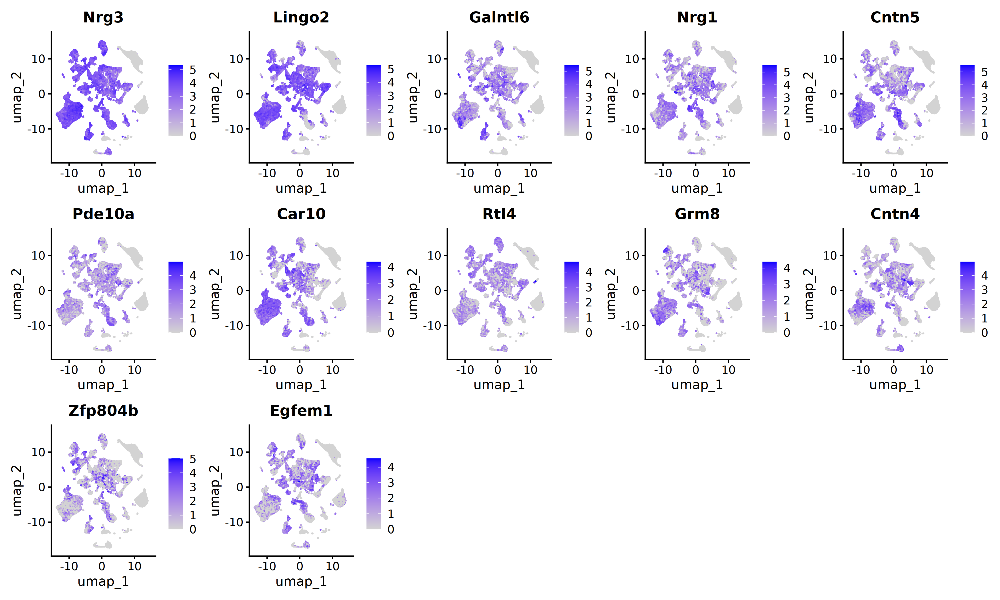

In [35]:
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(obj_cb_class, ncol = 5,
            cells = cells_d5_obob, 
            features = markers_of_neuron %>% pull(GeneID) %>% head(15))

In [37]:
obj_cb_class

An object of class Seurat 
29458 features across 52605 samples within 2 assays 
Active assay: RNA (27458 features, 5000 variable features)
 3 layers present: scale.data, data, counts
 1 other assay present: integrated
 2 dimensional reductions calculated: pca, umap

In [38]:
filter_down_cells = function(xenium.obj){
    keep_cells = xenium.obj %>% `[[` %>%
        filter(cell_area < 20000) %>%
        filter(cell_area > 100) %>%
        filter(avg_confidence >= 0.99) %>%
        filter(nCount_Xenium >= 100) %>%
        filter(nCount_Xenium <= 10000) %>%
        rownames
    xenium.obj = subset(xenium.obj, cells = keep_cells)
    xenium.obj
}

In [39]:
xe_obj = xenium.obj %>%
filter_down_cells %>% suppressWarnings

xe_obj

An object of class Seurat 
400 features across 40419 samples within 4 assays 
Active assay: Xenium (100 features, 0 variable features)
 2 layers present: counts, data
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [41]:
xe_obj = xe_obj %>% 
      SCTransform(assay = "Xenium") %>%
      RunPCA(features = xe_feats, npcs = 80) %>%
      RunUMAP(assay='Xenium', slot='counts', dims = 1:80, return.model = TRUE)  %>%
      FindNeighbors(., return.neighbor=F) %>%
      FindClusters(., resolution = 0.8)
xe_obj

Running SCTransform on assay: Xenium

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 100 by 40419

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 99 genes, 5000 cells

Second step: Get residuals using fitted parameters for 100 genes

Computing corrected count matrix for 100 genes

Calculating gene attributes

Wall clock passed: Time difference of 7.179337 secs

Determine variable features

Centering data matrix

Place corrected count matrix in counts slot

Set default assay to SCT

Warning message in irlba(A = t(x = object), nv = npcs, ...):
“You're computing too large a percentage of total singular values, use a standard svd instead.”
PC_ 1 
Positive:  Plp1, Bmp4, Ptprd, Plcl1, Pdgfra, Pcdh9, Plxdc2, Nkain2, Csmd1, Lrmda 
	   Pcdh11x, Cfap299, Naaladl2, Immp2l, Fhit, P3h2, Rtl4, Macrod2, Htr3

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40419
Number of edges: 1207735

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.8750
Number of communities: 23
Elapsed time: 15 seconds


An object of class Seurat 
500 features across 40419 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 3 layers present: counts, data, scale.data
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [43]:
library(CellAnnotatoR)

In [147]:
annotate_by_level = function(obj, 
                             counts_assay='RNA', 
                             graph_name='RNA_snn', 
                             classification_data_path=classification_data_path, 
                             annotation_col=classification_data_path){
    #uses conos, cellannotater
    if (is.null(counts_assay)) {
        counts_assay = obj@active.assay
    }
    
    cm <- obj@assays[[counts_assay]]$counts
    cm_norm <- Matrix::t(obj@assays[[counts_assay]]$data)
    
    
    if (!is.null(graph_name)){
        if (graph_name == 'active_snn'){
            graph_name = paste0(counts_assay, '_snn')
            graph <- obj@graphs[[graph_name]]
        } else {
            graph <- obj@graphs[[graph_name]]
        }
    } else {
        graph = NULL
    }
    emb <- obj@reductions$umap@cell.embeddings
    clusters <- setNames(obj@meta.data$seurat_clusters, rownames(obj@meta.data))
    clf_data <- getClassificationData(cm, classification_data_path)
    ann_by_level <- assignCellsByScores(graph=graph, clf_data, clusters=clusters)
    Idents(obj) <- ann_by_level$annotation$l1
#     p2 = DimPlot(obj, reduction = "umap", label=T, repel = T)+NoLegend() 
    obj[[annotation_col]] <- obj@active.ident
    obj@misc$clf_data = clf_data
    obj@misc$ann_by_level = ann_by_level
    obj
}

In [270]:
xe_obj = annotate_by_level(xe_obj,
                           counts_assay='Xenium', 
                           graph_name=NULL, 
                           classification_data_path='resolve_major_classes_markers_v2.txt', 
                           annotation_col='class')

In [271]:
xe_obj@misc$ann_by_level$scores$l1

,neuron,other
,<dbl>,<dbl>
Cell10000_9129_13312_1,1.0000000,0.0000000
Cell10006_3751_1404_1,0.7952881,0.2047119
Cell10007_5614_2509_1,0.0000000,1.0000000
Cell10008_4292_3239_1,1.0000000,0.0000000
Cell10010_8364_12318_1,1.0000000,0.0000000
Cell10019_6171_751_1,1.0000000,0.0000000
Cell1001_7582_755_1,0.0000000,1.0000000
Cell10021_10259_2827_1,1.0000000,0.0000000
Cell10027_7136_4916_1,1.0000000,0.0000000


In [272]:
xe_obj = xe_obj %>% 
AddMetaData(xe_obj@misc$ann_by_level$scores$l1)

In [273]:
df = xe_obj %>% 
AddMetaData(xe_obj@misc$ann_by_level$scores$l1)  %>%
`[[`

In [372]:
cutoff_score = .999

high_conf_cells = xe_obj %>%
`[[` %>% 
mutate(low_conf_score = case_when((neuron < cutoff_score) & (neuron > 1-cutoff_score) ~ TRUE,
                                  TRUE ~ FALSE)) %>%
filter(!low_conf_score) %>%
rownames

high_conf_cells %>% length

[1] 37493

In [ ]:
get_high_conf_cells = function(xe_obj, cutoff_score){
    cutoff_score = .999

    high_conf_cells = xe_obj %>%
    `[[` %>% 
    mutate(low_conf_score = case_when((neuron < cutoff_score) & (neuron > 1-cutoff_score) ~ TRUE,
                                      TRUE ~ FALSE)) %>%
    filter(!low_conf_score) %>%
    rownames
    
    high_conf_cells
}

In [357]:
xe_obj %>% Cells %>% length

[1] 40419

[1] 1675   27

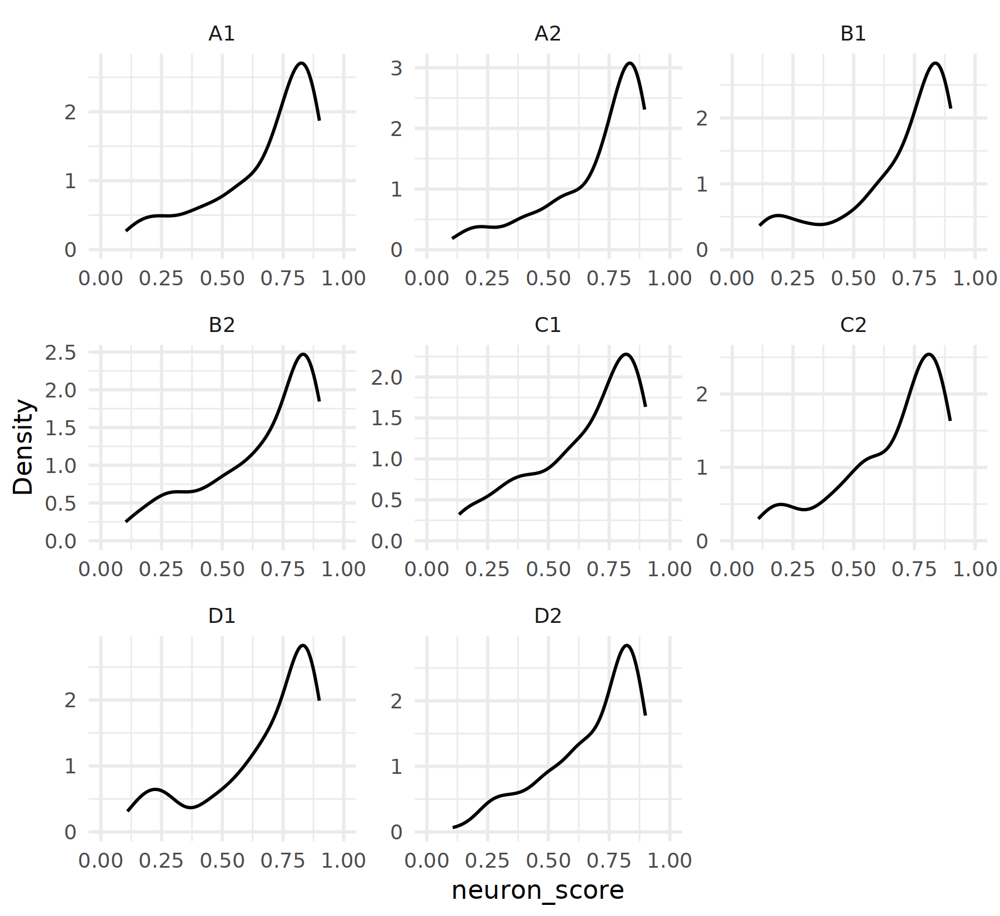

In [358]:
df = xe_obj %>% 
`[[` %>%
rownames_to_column %>%
filter(!(rowname %in% high_conf_cells)) %>%
mutate

dim(df)

ggplot(df, aes(x = neuron)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
#   scale_x_log10() +
  coord_cartesian(xlim = c(0, 1)) +
  theme_minimal() +
  labs(x = "neuron_score", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

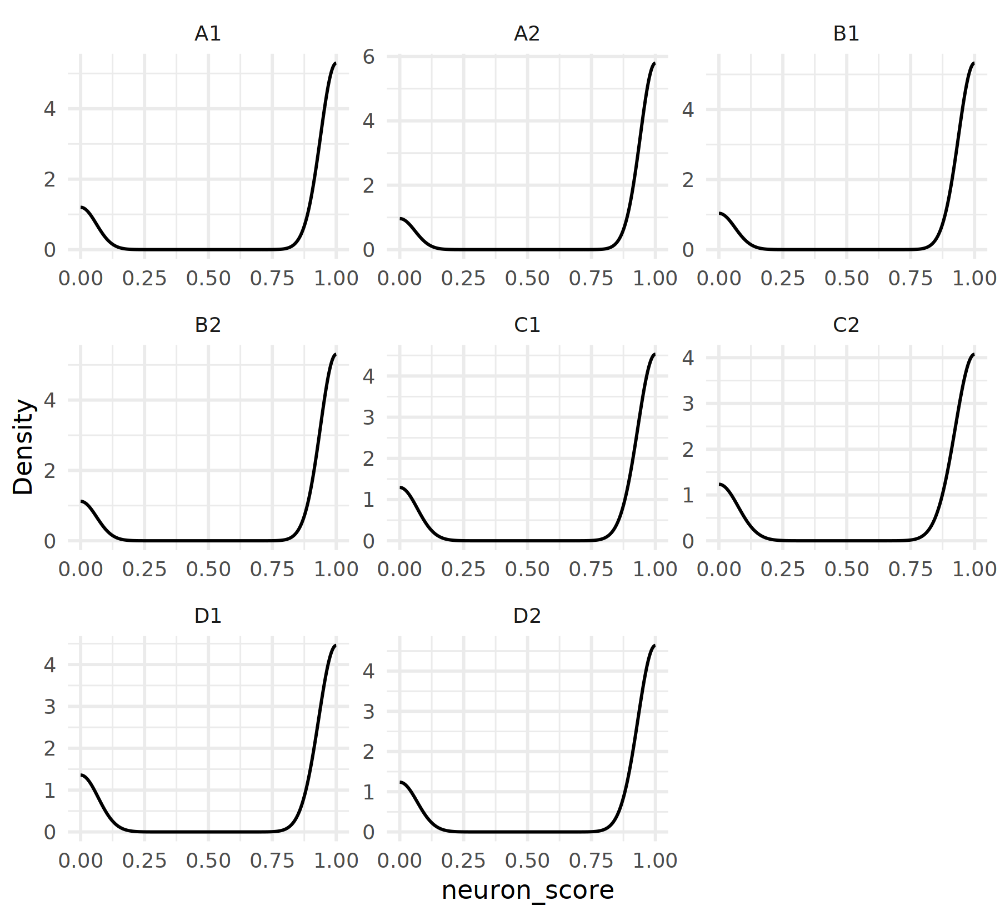

In [354]:
df = xe_obj %>% 
`[[` %>%
rownames_to_column %>%
filter(rowname %in% high_conf_cells)

ggplot(df, aes(x = neuron)) +
  geom_density(alpha = 0.6) +  # Removed the fill mapping to nCount_Xenium
  facet_wrap(~ sample_name, scales = "free") +  # Changed to facet by sample_name
#   scale_x_log10() +
  coord_cartesian(xlim = c(0, 1)) +
  theme_minimal() +
  labs(x = "neuron_score", y = "Density") +  # Corrected the x-axis label
  scale_fill_viridis_d() +  # Kept for color scale, adjust as needed
  theme(legend.position = "bottom")

In [364]:
xe_obj

An object of class Seurat 
500 features across 40419 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 3 layers present: counts, data, scale.data
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [279]:
xe_obj = xe_obj %>% 
      SCTransform(assay = "Xenium") %>%
#       RunPCA(features = xe_feats, npcs = 80) %>%
      RunUMAP(assay='Xenium', slot='counts', dims = 1:5, return.model = TRUE)  %>%
      FindNeighbors(., return.neighbor=F) %>%
      FindClusters(., resolution = 0.2)
xe_obj

Running SCTransform on assay: Xenium

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 100 by 40419

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 99 genes, 5000 cells

Second step: Get residuals using fitted parameters for 100 genes

Computing corrected count matrix for 100 genes

Calculating gene attributes

Wall clock passed: Time difference of 5.473348 secs

Determine variable features

Centering data matrix

Place corrected count matrix in counts slot

Set default assay to SCT

UMAP will return its model

23:04:26 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:04:26 Read 40419 rows and found 5 numeric columns

23:04:26 Using Annoy for neighbor search, n_neighbors = 30

Fou

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40419
Number of edges: 1207735

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9355
Number of communities: 11
Elapsed time: 18 seconds


An object of class Seurat 
500 features across 40419 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 3 layers present: counts, data, scale.data
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [280]:
xe_obj = xe_obj %>% 
      SCTransform(assay = "Xenium") %>%
#       RunPCA(features = xe_feats, npcs = 80) %>%
      RunUMAP(assay='Xenium', slot='data', features = c("Agrp", "Aqp4", "Bmp4", "Cfap299", "Cntn4", "Cntn5", "Grm8", "Hs3st4", "Kcnip4", "Pdgfra", "Pdzrn3", "Plp1", "Pomc", "Rax", "Rbfox1", "Slc1a2", "Slc7a11", "Tenm2", "Trpm3", "Zfp804b"),
              return.model = TRUE)  %>%
      FindNeighbors(., return.neighbor=F) %>%
      FindClusters(., resolution = 0.2)
xe_obj

Running SCTransform on assay: Xenium

vst.flavor='v2' set. Using model with fixed slope and excluding poisson genes.

Calculating cell attributes from input UMI matrix: log_umi

Variance stabilizing transformation of count matrix of size 100 by 40419

Model formula is y ~ log_umi

Get Negative Binomial regression parameters per gene

Using 99 genes, 5000 cells

Second step: Get residuals using fitted parameters for 100 genes

Computing corrected count matrix for 100 genes

Calculating gene attributes

Wall clock passed: Time difference of 4.299765 secs

Determine variable features

Centering data matrix

Place corrected count matrix in counts slot

Set default assay to SCT

UMAP will return its model

23:06:34 UMAP embedding parameters a = 0.9922 b = 1.112

Found more than one class "dist" in cache; using the first, from namespace 'spam'

Also defined by ‘BiocGenerics’

23:06:34 Read 40419 rows and found 20 numeric columns

23:06:34 Using Annoy for neighbor search, n_neighbors = 30

Fo

Modularity Optimizer version 1.3.0 by Ludo Waltman and Nees Jan van Eck

Number of nodes: 40419
Number of edges: 1207735

Running Louvain algorithm...
Maximum modularity in 10 random starts: 0.9355
Number of communities: 11
Elapsed time: 18 seconds


An object of class Seurat 
500 features across 40419 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 3 layers present: counts, data, scale.data
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 2 dimensional reductions calculated: pca, umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [ ]:
xe_obj %>%
Int

In [330]:
low_conf_cells = xe_obj %>% Cells %>% setdiff(high_conf_cells)

Warning message:
“Removed 2926 rows containing missing values (`geom_point()`).”


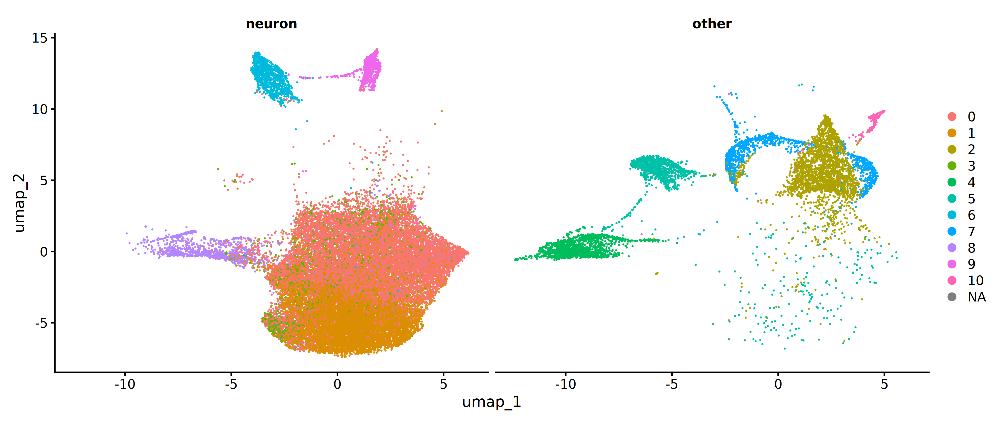

In [373]:
options(repr.plot.width=13, repr.plot.height=5.5, repr.plot.res=300)
DimPlot(xe_obj, reduction = 'umap', split.by='class', cells=high_conf_cells)

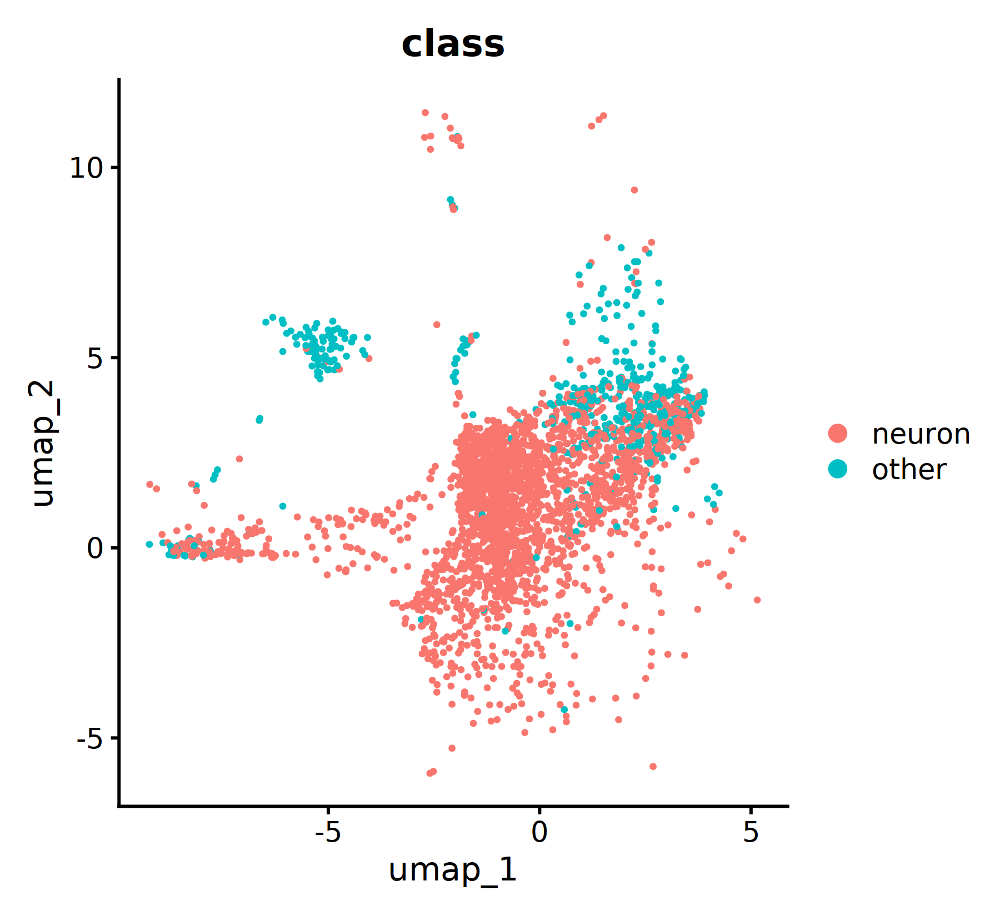

In [361]:
options(repr.plot.width=6, repr.plot.height=5.5, repr.plot.res=300)
DimPlot(xe_obj, reduction = 'umap', group.by='class', cells=low_conf_cells)

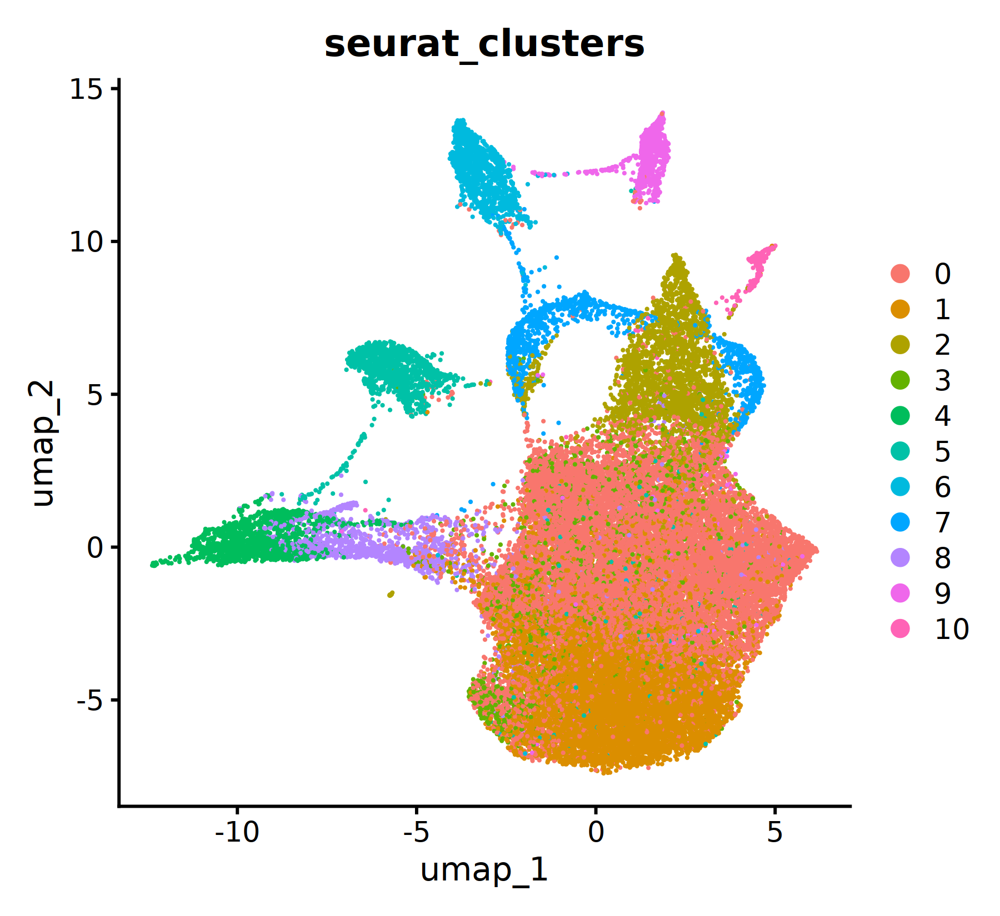

In [282]:
options(repr.plot.width=6, repr.plot.height=5.5, repr.plot.res=300)
DimPlot(xe_obj, reduction='umap',group.by='seurat_clusters')

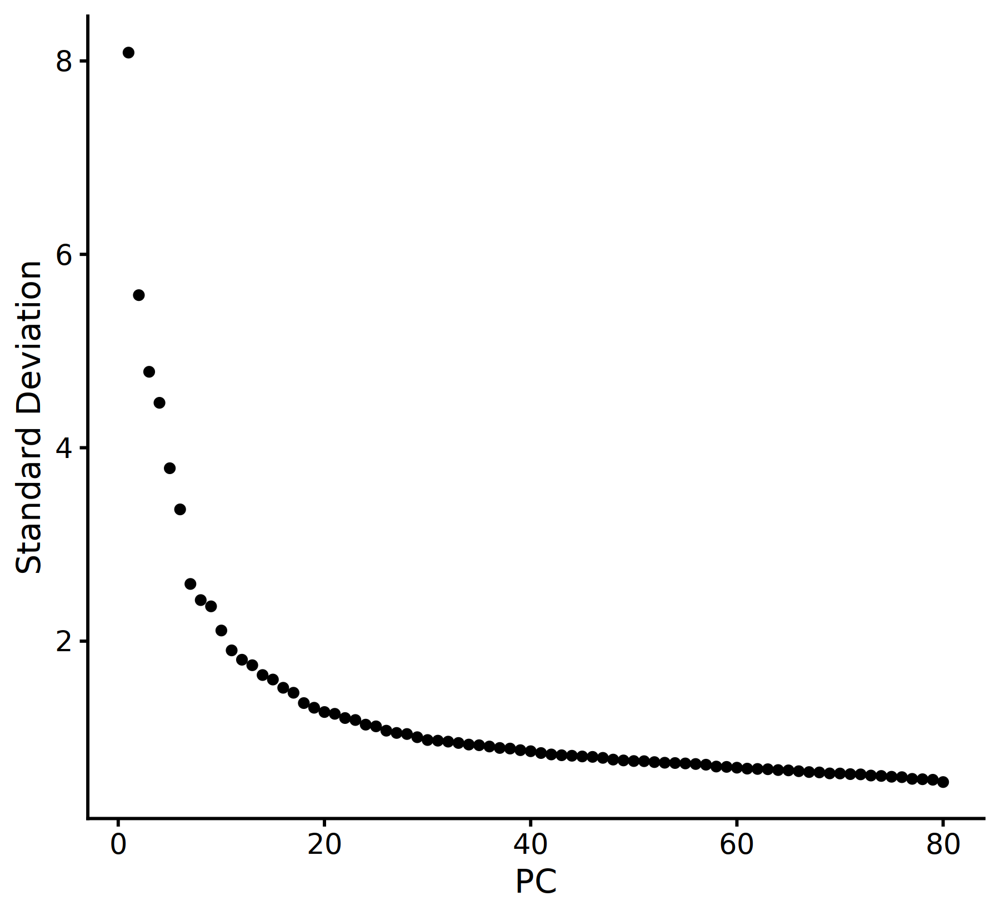

In [283]:
ElbowPlot(xe_obj, ndims = 80)

In [284]:
options(repr.plot.width=10, repr.plot.height=6, repr.plot.res=300)

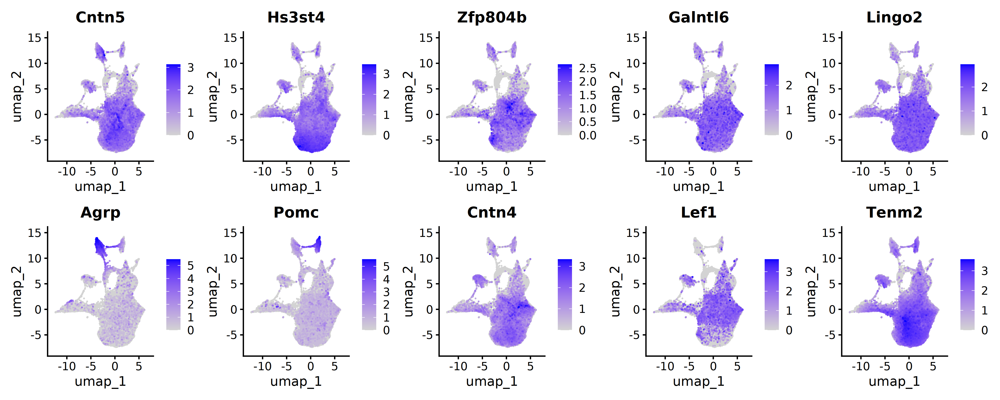

In [366]:
options(repr.plot.width=15, repr.plot.height=6, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, reduction='umap', cells=high_conf_cells, order=T,
            features = c("Cntn5", "Hs3st4", "Zfp804b", "Galntl6", "Lingo2", 
                         "Agrp", "Pomc", "Cntn4", "Lef1", "Tenm2")
)

In [286]:
xe_feats %>% length

[1] 99

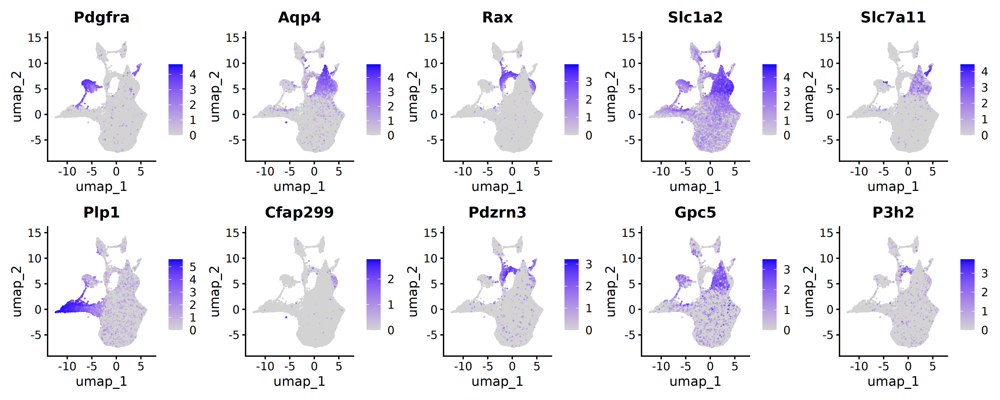

In [287]:
options(repr.plot.width=15, repr.plot.height=6, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, reduction='umap',
            features = c("Pdgfra", "Aqp4", "Rax", "Slc1a2", "Slc7a11", "Plp1", "Cfap299", "Pdzrn3", "Gpc5", "P3h2")
)

In [ ]:
options(repr.plot.width=15, repr.plot.height=60, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, reduction='umap',
            features = xe_feats,
)

In [ ]:
DefaultAssay(xe_obj) = 'SCT'
options(repr.plot.width=15, repr.plot.height=60, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, reduction='umap', order=T,
            features = xe_feats,
)

In [ ]:
qs::qread('../01_resolve/00_ingest_tibble.qs')

In [291]:
DefaultAssay(xe_obj) = 'Xenium'

other_markers_xe = xe_obj %>% 
    subset(., cells = sample(Cells(.), 20000)) %>%
    FindMarkers(features = xe_feats,
                slot='counts',
                group.by='class',
                ident.1='other',
                ident.2='neuron',
                test.use='negbinom',
                latent.vars="sample_name")

other_markers_xe = other_markers_xe %>%
    mutate(p_val_adj = case_when(p_val_adj < 1e-40 ~ 1e-40,
                                 TRUE ~ p_val_adj)) %>%
    add_gsea_cols_to_seurat_marker_results %>%
    mutate(pct_diff = abs(pct.1 - pct.2)) %>%
    arrange(pct_diff) %>%
    filter(p_val_adj < 0.05) %>%
    arrange(p_val_adj, desc(pct_diff))

other_markers_xe

Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Seurat objects”
Warning message:
“Not validating FOV objects”
Warning message:
“Not validating Centroids objects”
Warning message:
“Not validating

GeneID,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,ensmusg,gsea_sort_score,pct_diff
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<dbl>,<dbl>
Nrg3,0.000000e+00,-2.023277,0.358,0.885,1e-40,ENSMUSG00000041014,-80.93109,0.527
Tenm2,0.000000e+00,-2.269358,0.376,0.857,1e-40,ENSMUSG00000049336,-90.77431,0.481
Kcnip4,0.000000e+00,-2.124763,0.325,0.780,1e-40,ENSMUSG00000029088,-84.99052,0.455
Lingo2,0.000000e+00,-2.118368,0.220,0.672,1e-40,ENSMUSG00000045083,-84.73470,0.452
Aqp4,0.000000e+00,4.697741,0.608,0.163,1e-40,ENSMUSG00000024411,187.90965,0.445
Rbfox1,0.000000e+00,-2.204577,0.414,0.838,1e-40,ENSMUSG00000008658,-88.18306,0.424
Pde10a,0.000000e+00,-1.689959,0.386,0.808,1e-40,ENSMUSG00000023868,-67.59837,0.422
Grm7,0.000000e+00,-1.898416,0.434,0.854,1e-40,ENSMUSG00000056755,-75.93665,0.420
Fam155a,0.000000e+00,-1.697412,0.555,0.964,1e-40,NA,-67.89648,0.409


In [ ]:
other_markers_xe %>% 
filter(gsea_sort_score > 100) %>%
# filter(pct_diff > 0.3) %>%
# filter(pct.2 < 0.4) %>%
arrange(desc(pct_diff))

In [ ]:
other_markers_xe_neg = other_markers_xe %>% 
filter(gsea_sort_score < -50) %>%
# filter(pct_diff > 0.3) %>%
# filter(pct.2 < 0.4) %>%
arrange(gsea_sort_score)

other_markers_xe_neg

In [ ]:
DefaultAssay(xe_obj) = 'Xenium'
options(repr.plot.width=15, repr.plot.height=6, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, order= T,
            features = other_markers_xe_neg %>% pull(GeneID) %>% head(10)
)

In [ ]:
DefaultAssay(xe_obj) = 'SCT'
options(repr.plot.width=15, repr.plot.height=6, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5,
            features = other_markers_xe_neg %>% pull(GeneID) %>% head(10)
)

In [ ]:
 other_markers_xe_neg %>% pull(GeneID) %>% c("Cntn4")

In [ ]:
DefaultAssay(xe_obj) = 'SCT'
options(repr.plot.width=15, repr.plot.height=6, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, order=T,
            features =  other_markers_xe_neg %>% pull(GeneID) %>% c("Cntn4")
)

In [ ]:
other_markers_xe_pos = other_markers_xe %>% 
filter(gsea_sort_score > 50) %>%
# filter(pct_diff > 0.3) %>%
# filter(pct.2 < 0.4) %>%
arrange(desc(gsea_sort_score))

other_markers_xe_pos

In [ ]:
DefaultAssay(xe_obj) = 'Xenium'
options(repr.plot.width=15, repr.plot.height=9, repr.plot.res=300)
FeaturePlot(xe_obj, ncol = 5, order= T,
            features = other_markers_xe_pos %>% pull(GeneID) %>% head(15)
)

In [ ]:
xe_obj = annotate_by_level(xe_obj,
                           counts_assay='Xenium', 
                           graph_name=NULL, 
                           classification_data_path='resolve_major_classes_markers_v2.txt', 
                           annotation_col='class')

In [ ]:
options(repr.plot.width=6, repr.plot.height=5.5, repr.plot.res=300)
DimPlot(xe_obj, group.by='class')

In [ ]:
xe_obj %>%
`[[` %>%
group_by(class) %>%
summarise(n=n())

In [ ]:
other_markers_xe_pos %>% pull(GeneID) %>% dput

In [ ]:
xe_obj %>% `[[` %>% colnames

In [ ]:
source('../00_preprocessing/preprocessing.R')

In [ ]:
obj_fgf1 = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_all_n1xo')
obj_fgf1

In [ ]:
obj_fgf1 %>% `[[` %>% head

# All Xe genes integ

In [ ]:
xenium.obj = qs::qread('xenium.obj.qs')
xenium.obj

In [ ]:
xenium_genes = xenium.obj@assays$Xenium@meta.features %>% rownames
ref_genes = obj_fgf1@assays$SCT@meta.features %>% rownames
xenium_genes = xenium_genes %>% intersect(ref_genes)
xenium_genes = xenium_genes %>% tibble %>% filter(. != 'Lmx1a') %>% filter(. != 'Agrp') %>% pull

length(xenium_genes)
xenium_genes

In [ ]:
obj_fgf1 = obj_fgf1 %>% Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1 %>% qs::qsave('obj_fgf1_obob5v5.qs')
obj_fgf1

In [ ]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors <- FindTransferAnchors(reference = obj_fgf1, query = xenium.obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'pcaproject',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               reference.reduction='pca',
                               verbose=TRUE)

In [ ]:
xenium.obj_unimapped <- MapQuery(anchorset = anchors, reference = obj_fgf1, query = xenium.obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

In [ ]:
qs::qsave(xenium.obj_unimapped, '230710_xenium_sct_unimapped_polar_label.qs')

In [ ]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1, query = xenium.obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

In [ ]:
xenium.obj_unimapped_cca <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1, query = xenium.obj,
                                 refdata = list(cell_class = "cell_class"), reduction.model = "umap")

In [ ]:
qs::qsave(xenium.obj_unimapped_cca, '230710_xenium_sct_unimapped_cca_polar_label.qs')

In [ ]:
xe_neuron_cells = xenium.obj_unimapped_cca %>% 
`[[` %>% 
filter(predicted.cell_class == 'neuron') %>%
rownames
length(xe_neuron_cells)

xe_other_cells = xenium.obj_unimapped_cca %>% 
`[[` %>% 
filter(predicted.cell_class != 'neuron') %>%
rownames
length(xe_other_cells)

In [ ]:
xe_neurons_obj = xenium.obj_unimapped_cca %>%
subset(cells = xe_neuron_cells) %>%
Seurat::SCTransform(assay='Xenium',
                    method="glmGamPoi",
                    vst.flavor="v2",
                    verbose=TRUE) %>%
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
xe_neurons_obj

In [ ]:
obj_fgf1_neurons = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_neuron_obob5v5') %>% 
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1_neurons

In [ ]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1_neurons, query = xe_neurons_obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

In [ ]:
xe_neurons_obj <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1_neurons, query = xe_neurons_obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

In [ ]:
xe_neurons_obj %>% qs::qsave('xe_neurons_obj.qs')
obj_fgf1_neurons %>% qs::qsave('obj_fgf1_neurons.qs')

In [ ]:
p1 = DimPlot(xe_neurons_obj, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xe_neurons_obj, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1_neurons, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [ ]:
xe_other_obj = xenium.obj_unimapped_cca %>%
subset(cells = xe_other_cells) %>%
Seurat::SCTransform(assay='Xenium',
                    method="glmGamPoi",
                    vst.flavor="v2",
                    verbose=TRUE) %>%
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
xe_other_obj

In [ ]:
obj_fgf1_other = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_other_obob5v5') %>% 
Seurat::RunUMAP(assay='SCT', slot='counts', features = xenium_genes, return.model = TRUE)
obj_fgf1_other

In [ ]:
# anchors = FindIntegrationAnchors(obj_list, assay=c('SCT', 'SCT'), anchor.features=xenium_genes)
anchors_cca <- FindTransferAnchors(reference = obj_fgf1_other, query = xe_other_obj, features = xenium_genes,  
                               normalization.method = 'SCT',
                               reduction = 'cca',
                               query.assay = 'SCT',
                               reference.assay = 'SCT',
                               recompute.residuals = F,
                               verbose=TRUE)

In [ ]:
xe_other_obj <- MapQuery(anchorset = anchors_cca, reference = obj_fgf1_other, query = xe_other_obj,
                                 refdata = list(polar_label = "polar_label"), reduction.model = "umap")

In [ ]:
xe_other_obj %>% qs::qsave('xe_other_obj.qs')
obj_fgf1_other %>% qs::qsave('obj_fgf1_other.qs')

In [ ]:
p1 = DimPlot(xe_other_obj, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xe_other_obj, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1_other, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [ ]:
meta_other = xe_other_obj %>% 
`[[` %>%
select(predicted.cell_class.score, predicted.cell_class, 
       predicted.polar_label.score, predicted.polar_label) %>%
  rename_with(~paste0(., "_2s"), everything())

meta_neurons = xe_neurons_obj %>% 
`[[` %>%
select(predicted.cell_class.score, predicted.cell_class, 
       predicted.polar_label.score, predicted.polar_label) %>%
  rename_with(~paste0(., "_2s"), everything())

meta_new = rbind(meta_other, meta_neurons)

In [ ]:
xenium.obj_unimapped_cca_2s = xenium.obj_unimapped_cca %>% AddMetaData(metadata = meta_new)
xenium.obj_unimapped_cca_2s %>% `[[` 
qs::qsave(xenium.obj_unimapped_cca_2s, '230710_xenium_sct_unimapped_cca_polar_label.qs')

In [ ]:
p1 = DimPlot(xenium.obj_unimapped_cca_2s, reduction = "umap", group.by = "predicted.polar_label_2s", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xenium.obj_unimapped_cca_2s, reduction = "ref.umap", group.by = "predicted.polar_label_2s", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [ ]:
p1 = DimPlot(xenium.obj_unimapped, reduction = "umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p2 = DimPlot(xenium.obj_unimapped, reduction = "ref.umap", group.by = "predicted.polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "Spatial on snRNAseq reference UMAP")
p3 = DimPlot(obj_fgf1, reduction = "umap", group.by = "polar_label", label = TRUE, repel = TRUE) + theme(legend.position = "none") + labs(title = "snRNAseq reference")
options(repr.plot.width=30, repr.plot.height=10)
p1 + p2 + p3

In [ ]:
library(tidyverse)

In [ ]:
meta = targets::tar_meta()

In [ ]:
targets::tar_meta() %>% filter(name == 'xe_neuron_cells')

In [ ]:
rgs_markers = qs::qread('_targets/objects/all_markers_xe_cca_unimapped_2s') %>% filter(cluster == 'Rgs16_Dlx1') %>% pull(gene) %>% head

In [ ]:
qs::qread('_targets/objects/all_markers_xe_cca_unimapped_2s') %>% filter(cluster == 'Rgs16_Dlx1')

In [ ]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_unimapped_2s')

In [ ]:
options(repr.plot.width=20, repr.plot.height=10)
xe_obj %>% VlnPlot(features = c('Fgf13', 'Nrxn3', 'Galntl6', 'Dlg2'), group.by = 'predicted.label') + theme(legend.position = "none")

In [ ]:
options(repr.plot.width=20, repr.plot.height=20)
ImageFeaturePlot(xe_obj, features = c('Fgf13', 'Nrxn3', 'Galntl6', 'Dlg2'), fov='fov.6', max.cutoff = c(25,
    35, 12, 10), size = 0.75, cols = c("white", "red"))

In [ ]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_other_labels')

In [ ]:
xe_obj

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
p1 = DimPlot(xe_obj, reduction = "umap", group.by = "labels", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p1

In [ ]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_00')
xe_obj
xe_obj %>% `[[` %>% head

In [ ]:
options(repr.plot.width=10, repr.plot.height=10)
p1 = DimPlot(xe_obj, reduction = "umap", group.by = "predicted.id", label = TRUE, repel = TRUE) + theme(legend.position = "none")  + labs(title = "Spatial on spatial UMAP")
p1

In [ ]:
xe_obj

In [ ]:
column = 'labels'
obj_fgf1 %>% `[[` %>% `$`(!(column))

In [ ]:
obj_fgf1 = qs::qread('../genebasisr_obob5v5/_targets/objects/exp_all_n1xo')
obj_fgf1

In [ ]:
obj_fgf1 %>%
`[[` %>%
group_by(labels) %>%
summarise(n=n()) %>%
arrange(n)

In [ ]:
xe_obj

In [ ]:
get_xe_genes_all = function(xe_obj){
    xenium_genes_all = xe_obj %>% 
             `@`('assays') %>% 
             `$`('Xenium') %>% 
             `@`('meta.features') %>% 
             rownames %>%
             tibble %>%
             filter(. != 'Lmx1a') %>% #this failed qc
             rownames
    xenium_genes_all
}

In [ ]:
xe_obj %>% 
             `@`('assays') %>% 
             `$`('Xenium') %>% 
             `@`('meta.features') %>% 
             rownames_to_column %>%
             filter(rowname != 'Lmx1a') 

In [ ]:
get_xe_genes = function(xe_obj, obj_fgf1){
    ref_genes_all= obj_fgf1 %>% 
                `@`('assays') %>% 
                `$`('SCT') %>% 
                `@`('meta.features') %>% 
                rownames

        xenium_genes = xe_obj %>% 
                `@`('assays') %>% 
                `$`('Xenium') %>% 
                `@`('meta.features') %>% 
                rownames %>%
                intersect(ref_genes_all) %>%
                tibble %>%
                filter(. != 'Agrp') %>% #this is not common between both datasets
                pull
        xenium_genes
}

In [ ]:
get_xe_genes(xe_obj, obj_fgf1)

In [ ]:
obj_fgf1

In [ ]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_class_uni')
xe_obj

In [ ]:
xe_obj@

In [ ]:
xe_obj %>% `[[`